# Genetic Algorithm Exercise

In [1]:
import random
from mpl_toolkits import mplot3d
from matplotlib import pyplot as plt
import numpy as np
import math
import copy
from collections import defaultdict
from timeit import timeit
import time

%matplotlib inline

Minimise the the following functions:

In [2]:
def f1(x):
    return np.power(x, 2)
def f2(x, y):
    return 20 + f2_(x) + f2_(y)
def f2_(x):
    return x**2 - 10*np.cos(2*3.14*x)
def f3(x):
#     x += 4 
    x = np.multiply(x, 7/100)
    return .1*np.power(x, 4) - 5*np.power(x, 2) + np.multiply(x, 5)

In [3]:
np.multiply([5,6,7],5)

array([25, 30, 35])

<function matplotlib.pyplot.show(close=None, block=None)>

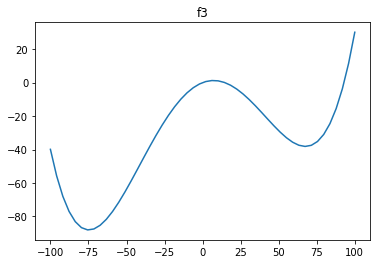

In [4]:
x = np.linspace(-100, 100)
plt.plot(x, f3(x))
plt.title("f3")
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

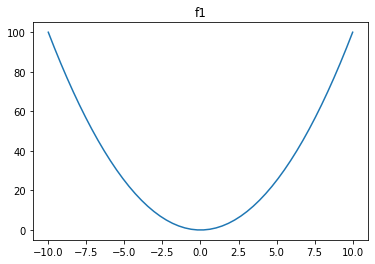

In [5]:
x = np.linspace(-10, 10)
plt.plot(x, f1(x))
plt.title("f1")
plt.show

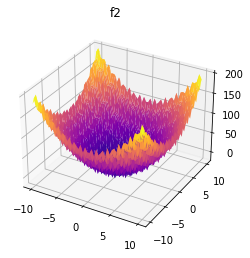

In [6]:
space = np.linspace(-10, 10)
x, y = np.meshgrid(space, space)
z = f2_(x) + f2_(y)

fig = plt.figure()
 
# syntax for 3-D plotting
ax = plt.axes(projection ='3d')
 
# syntax for plotting
ax.plot_surface(x, y, z, cmap='plasma')
ax.set_title('f2')
plt.show()

In [7]:
from abc import ABC, abstractmethod

class model(ABC):
    @abstractmethod
    def eval(task):
        #return y
        pass
    @abstractmethod
    def spawn():
        return children
        pass
    

class basics(model):
    def __init__(self, x):
        super().__init__(x/2)
        self.x = x
        
    def check(self):
#         print(self)
#         print(super())
        super().check()
        print("my x: ", self.x)
    
    def jj():
        print("implemented")
    


In [44]:
# m = model(5)
# m.check()
s = submodel(6)
s.check()

my u:  3.0
my x:  6


In [ ]:
def spawner(p):
    ans = []
    for thing in p:
        ans += thing.spawn()

In [ ]:
def experiment(spawner, tester, p0, max_generations = 10, stopCriteria = None):
    p = p0
    results = []
    for i in range(max_generations):
        if stopCriteria:
            break
        scores = tester(p)
        p = selector(p, scores)
        results += [scores]
        p = spawner(p)
    return results

In [7]:
## generate children and add to population
def spawn_nextgen(N, birthrate = 10, variance = .1):
    N2 = copy.deepcopy(N)
    for n in N:
        N2 += [n+random.gauss(0,variance) for x in range(birthrate)]
    return N2

In [8]:
def show_x_fitness(x, f):
    plt.scatter(x, f(x))


In [9]:
def select(N, f, pop):
    ordered = sorted(N, key=f)
    return ordered[:pop]

In [10]:
def sim_loss_epochs_T(n, f, samples, epochs = 25):
    converge = defaultdict(lambda : 0)
    for i in range (samples):
        N = [random.uniform(-150, 150) for _ in range(n)]
        Avg_fitness = [100,101]
        while int(Avg_fitness[-1]) != int(Avg_fitness[-2]):
#             print (np.average(f(N)))
            nextgen = spawn_nextgen(N)
            N = select(nextgen, f, n)
            Avg_fitness += [np.average(f(N))]

        plt.plot(Avg_fitness[2:])
        final = int(Avg_fitness[-1])//1
        converge[final] += 1
    print("convergence to each minima: ", converge)

In [11]:
def sim_loss_epochs_E(n, f, samples, epochs = 25):
    converge = defaultdict(lambda : 0)
    for i in range (samples):
        N = [random.uniform(-150, 150) for _ in range(n)]
        Avg_fitness =[100,101]
#         while N:
        for i in range(epochs):
            nextgen = spawn_nextgen(N)
            N = select(nextgen, f, len(N)//2)
            Avg_fitness += [np.average(f(N))]
            if int(Avg_fitness[-1]) == int(Avg_fitness[-2]):
                break
            if not N:
                break
        plt.plot(Avg_fitness[2:])
        final = int(Avg_fitness[-2])//1
        converge[final] += 1
    print("convergence to each minima: ", converge)

In [12]:
# N = [random.uniform(-10, 10) for _ in range(100)]
# Avg_fitness = [100,101]
# for i in range(10):
#     nextgen = spawn_nextgen(N)
#     Avg_fitness += [sum(f3(nextgen))/len(nextgen)]
#     N = select(nextgen, f3, len(N)//2)
#     show_x_fitness(N, f3)
#     plt.show()
# # plt.plot(Avg_fitness)

convergence to each minima:  defaultdict(<function sim_loss_epochs_E.<locals>.<lambda> at 0x0000015EBB127C10>, {-87: 4, -88: 11})


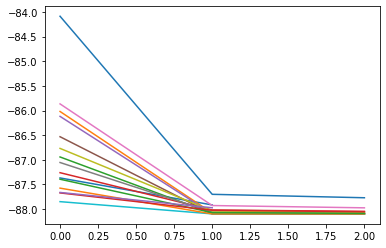

In [15]:
sim_loss_epochs_E(160, f3, 15, epochs=350)

convergence to each minima:  defaultdict(<function sim_loss_epochs_T.<locals>.<lambda> at 0x0000015EBD6901F0>, {-87: 6, -88: 9})


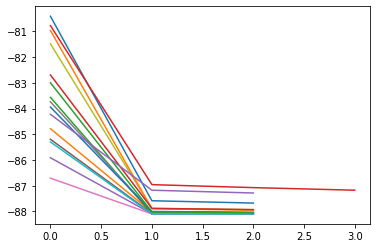

In [16]:
sim_loss_epochs_T(100, f3, 15, epochs=350)

In [125]:
def T_epoch(N, f, n):
    nextgen = spawn_nextgen(N, variance=2)
    Avg_fitness = [np.average(f(nextgen))]
    N = select(nextgen, f, n)
    return N, Avg_fitness

def sim_loss_epochs_T_timed(n, f, samples, epochs = 25):
    converge = defaultdict(lambda : 0)
    num_epochs = []
    fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(15,6))
    
    for i in range (samples):
        N = [random.uniform(-100, 100) for _ in range(n)]
        Avg_fitness = [100,101]
        epoch_times = [0]
        
        while int(Avg_fitness[-1]) != int(Avg_fitness[-2]):
#             epoch_times += [timeit('T_epoch(N, f, n)')]
            epoch_start = time.process_time() 
            N, A= T_epoch(N , f, n)
            epoch_end = time.process_time()
            epoch_times += [epoch_end - epoch_start]
            Avg_fitness += A
            
        final = int(Avg_fitness[-1])//1
        converge[final] += 1
        num_epochs += [len(Avg_fitness)]
        plt.subplot(2,2,1) 
        plt.plot(Avg_fitness)
        plt.subplot(2,2,2) 
        plt.plot(epoch_times)
        plt.subplot(2,2,4) 
        plt.plot(np.cumsum(epoch_times))

    plt.subplot(2,2,3) 
    plt.hist(num_epochs)
    print("convergence to each minima: ", converge)

<ipython-input-125-e9406918410f>:28: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  plt.subplot(2,2,1)
<ipython-input-125-e9406918410f>:30: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  plt.subplot(2,2,2)
<ipython-input-125-e9406918410f>:32: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and

<ipython-input-125-e9406918410f>:28: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  plt.subplot(2,2,1)
<ipython-input-125-e9406918410f>:30: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  plt.subplot(2,2,2)
<ipython-input-125-e9406918410f>:32: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and

<ipython-input-125-e9406918410f>:32: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  plt.subplot(2,2,4)
<ipython-input-125-e9406918410f>:28: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  plt.subplot(2,2,1)
<ipython-input-125-e9406918410f>:30: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and

<ipython-input-125-e9406918410f>:30: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  plt.subplot(2,2,2)
<ipython-input-125-e9406918410f>:32: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  plt.subplot(2,2,4)
<ipython-input-125-e9406918410f>:28: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and

convergence to each minima:  defaultdict(<function sim_loss_epochs_T_timed.<locals>.<lambda> at 0x000001D30BBE44C0>, {-87: 88, -37: 7, -38: 5})


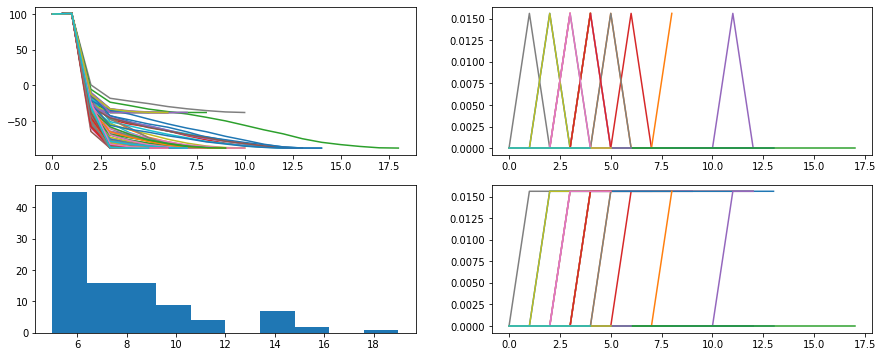

In [126]:
sim_loss_epochs_T_timed(5, f3, 100)

In [17]:
def E_epoch(N, f, n):
    nextgen = spawn_nextgen(N)
    Avg_fitness = [np.average(f(nextgen))]
    N = select(nextgen, f, len(N)//2)
    return N, Avg_fitness

def sim_loss_epochs_E_timed(n, f, samples, epochs = 25):
    
    converge = defaultdict(lambda : 0)
    num_epochs = []
    fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(15,5))
    
    for i in range (samples):
        N = [random.uniform(-100, 100) for _ in range(n)]
        Avg_fitness = []
        epoch_times = []
        
        while len(N) > 1: # and (abs(Avg_fitness[-1] - Avg_fitness[-2]) < 1) if len(Avg_fitness)>2 else True:
            epoch_start = time.process_time() 
            N, A= E_epoch(N , f, n)
            epoch_end = time.process_time()
            epoch_times += [epoch_end - epoch_start]
            Avg_fitness += A
            
        final = int(Avg_fitness[-1])//1
        converge[final] += 1
        num_epochs += [len(Avg_fitness)]
        plt.subplot(2,2,1) 
        plt.plot(Avg_fitness)
        plt.subplot(2,2,2) 
        plt.plot(epoch_times)
        plt.subplot(2,2,4) 
        plt.plot(np.cumsum(epoch_times))
        
    plt.subplot(2,2,3) 
    plt.hist(num_epochs)
    print("convergence to each minima: ", converge)

<ipython-input-17-4fddf92ef45f>:28: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  plt.subplot(2,2,1)
<ipython-input-17-4fddf92ef45f>:30: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  plt.subplot(2,2,2)
<ipython-input-17-4fddf92ef45f>:32: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and re

<ipython-input-17-4fddf92ef45f>:30: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  plt.subplot(2,2,2)
<ipython-input-17-4fddf92ef45f>:32: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  plt.subplot(2,2,4)
<ipython-input-17-4fddf92ef45f>:28: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and re

<ipython-input-17-4fddf92ef45f>:28: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  plt.subplot(2,2,1)
<ipython-input-17-4fddf92ef45f>:30: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  plt.subplot(2,2,2)
<ipython-input-17-4fddf92ef45f>:32: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and re

<ipython-input-17-4fddf92ef45f>:32: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  plt.subplot(2,2,4)
<ipython-input-17-4fddf92ef45f>:28: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  plt.subplot(2,2,1)
<ipython-input-17-4fddf92ef45f>:30: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and re

<ipython-input-17-4fddf92ef45f>:28: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  plt.subplot(2,2,1)
<ipython-input-17-4fddf92ef45f>:30: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  plt.subplot(2,2,2)
<ipython-input-17-4fddf92ef45f>:32: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and re

<ipython-input-17-4fddf92ef45f>:30: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  plt.subplot(2,2,2)
<ipython-input-17-4fddf92ef45f>:32: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  plt.subplot(2,2,4)
<ipython-input-17-4fddf92ef45f>:28: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and re

<ipython-input-17-4fddf92ef45f>:28: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  plt.subplot(2,2,1)
<ipython-input-17-4fddf92ef45f>:30: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  plt.subplot(2,2,2)
<ipython-input-17-4fddf92ef45f>:32: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and re

<ipython-input-17-4fddf92ef45f>:32: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  plt.subplot(2,2,4)
<ipython-input-17-4fddf92ef45f>:28: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  plt.subplot(2,2,1)
<ipython-input-17-4fddf92ef45f>:30: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and re

<ipython-input-17-4fddf92ef45f>:28: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  plt.subplot(2,2,1)
<ipython-input-17-4fddf92ef45f>:30: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  plt.subplot(2,2,2)
<ipython-input-17-4fddf92ef45f>:32: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and re

<ipython-input-17-4fddf92ef45f>:32: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  plt.subplot(2,2,4)
<ipython-input-17-4fddf92ef45f>:28: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  plt.subplot(2,2,1)
<ipython-input-17-4fddf92ef45f>:30: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and re

convergence to each minima:  defaultdict(<function sim_loss_epochs_E_timed.<locals>.<lambda> at 0x000001D30B6A0A60>, {-88: 90, -87: 10})


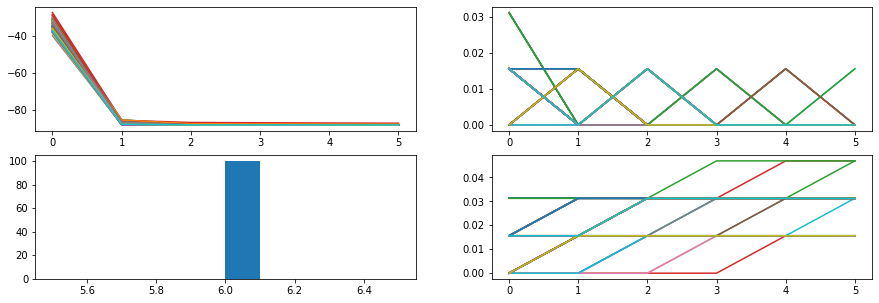

In [18]:
sim_loss_epochs_E_timed(100, f3, 100)

## Paper outlining this comparison:
https://www.researchgate.net/publication/225208838_Genetic_algorithms_with_shrinking_population_size

## Traditional Approach
* Static compute time for each epoch
* Convergence time depends on how difficult it is to find the local minima

## Other Approach
* Compute time is halved for each epoch
* Convergence is determined by size of initial population

In [19]:
# def T_epoch(N, f, n):
#     nextgen = spawn_nextgen(N)
#     Avg_fitness = [np.average(f(nextgen))]
#     N = select(nextgen, f, n)
#     return N, Avg_fitness

# def E_epoch(N, f, n):
#     nextgen = spawn_nextgen(N)
#     Avg_fitness = [np.average(f(nextgen))]
#     N = select(nextgen, f, len(N)//2)
#     return N, Avg_fitness

# def sim_loss_epochs(n, f, samples, epochs = 25):
#     converge = defaultdict(lambda : 0)
#     for i in range (samples):
#         N = [random.uniform(-10, 10) for _ in range(n)]
#         Avg_fitness = []
#         epoch_times = [0]
#         while len(N) > 1:
# #             epoch_times += [timeit('T_epoch(N, f, n)')]
#             epoch_start = time.process_time() 
#             N, A= E_epoch(N , f, n)
#             epoch_end = time.process_time()
#             epoch_times += [epoch_end - epoch_start + epoch_times[-1]]
#             Avg_fitness += A
#         final = int(Avg_fitness[-1])//240
#         converge[final] += 1
#         plt.plot(epoch_times)
# #         plt.plot(Avg_fitness)
#     print("convergence to each minima: ", converge)

In [20]:
class blip:
    def __init__(self, _x, _y):
        self.x = _x
        self.y = _y
#         self.z = _z
        self.sigma = 2
    def z(self):
        return f2(self.x, self.y)

In [21]:
## Initialize population
n = 50
# random.uniform(-10, 10)
# for _ in range(n):
    

N = [blip(random.uniform(-10, 10), random.uniform(-10, 10)) for _ in range(n)]
N

In [22]:
## generate children and add to population
birthrate = 20
variance = .1

def spawn_nextgen_f2(N):
    N2 = copy.deepcopy(N)
    for n in N:
        for _ in range(birthrate):
            baby = copy.deepcopy(n)
            baby.sigma+= random.gauss(0,variance)
            baby.x += random.gauss(0,baby.sigma)
            baby.y += random.gauss(0,baby.sigma)
            N2 += [baby]
    return N2

In [23]:
def show_f2_fitness(N):
    x = [b.x for b in N]
    y = [b.x for b in N]
    z = [b.z() for b in N]
#     z = [b.x for b in N]
    fig = plt.figure()
    # syntax for 3-D plotting
    ax = plt.axes(projection ='3d')
    # syntax for plotting
    ax.scatter(x, y, z, cmap='plasma')
    ax.set_title('f2')
    plt.show()

In [24]:
def f2_blip(blip):
    return blip.z()
def select_f2(N):
    ordered = sorted(N, key=f2_blip)
    return ordered[:n]

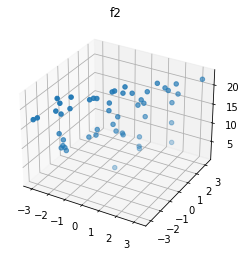

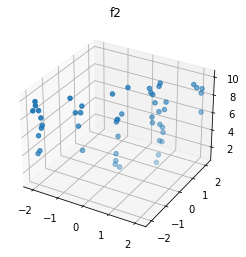

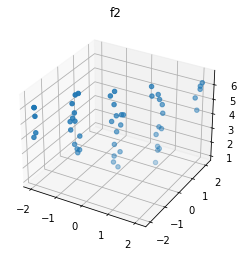

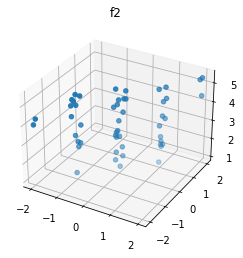

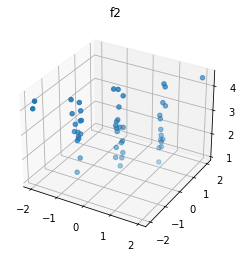

...

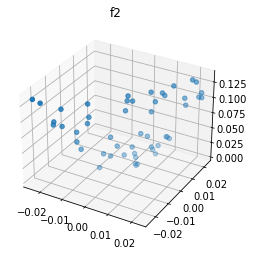

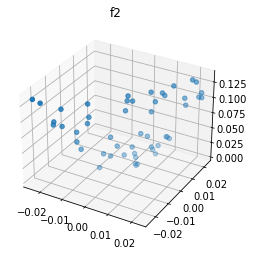

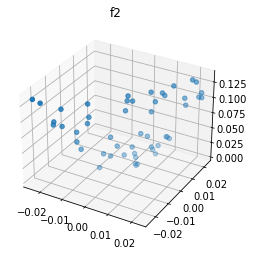

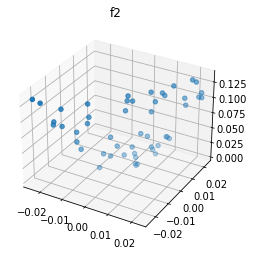

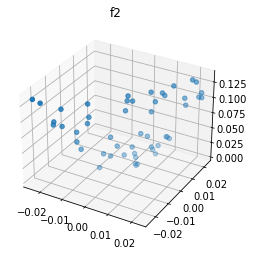

In [25]:
for i in range(500):
    nextgen = spawn_nextgen_f2(N)
    N = select_f2(nextgen)
    show_f2_fitness(N)

In [26]:
(np.array([b.sigma for b in N]) > 2).sum() / len(N)

0.14

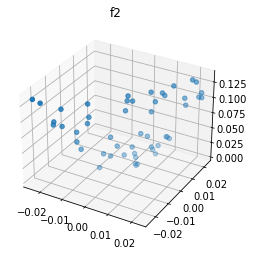

In [27]:
show_f2_fitness(N)

In [28]:
[b.sigma for b in N]

[1.5598713757198357,
 1.452544206221137,
 1.6040062288237007,
 2.1007851732653777,
 1.554042149820712,
 1.6292445687634984,
 1.9554710669003958,
 1.6895558635958028,
 1.3558161081999456,
 2.026166110369231,
 1.943274265397555,
 1.6440268705442733,
 1.5160437423784816,
 1.4691131177224537,
 2.101395018912165,
 1.4500307776952852,
 1.6036132119642672,
 1.7531853261254668,
 1.955857262824661,
 2.011674623857667,
 1.48604168326091,
 1.5475790831479679,
 1.7863704314410032,
 1.4810602454634656,
 1.4640724519637591,
 1.9585197941912582,
 1.5413378633489512,
 2.0129360942894325,
 1.4642799404540803,
 1.4517504150795366,
 1.555521734725755,
 1.2066159364905922,
 1.5200292090988845,
 1.0903358602096787,
 1.3101345244999005,
 1.811464236706391,
 1.716397417584389,
 1.3492536532438755,
 2.1222308044708935,
 1.8604262767307724,
 1.4904223323077008,
 1.2009632531509136,
 1.441717364537679,
 1.7514001445693688,
 1.8169315341134538,
 1.4548906796327454,
 1.4091154065897462,
 1.4439835698501486,
 2.00

In [29]:
a = [1,2,3]
b = [

SyntaxError: unexpected EOF while parsing (<ipython-input-29-9b1b4bfc3928>, line 2)